<a href="https://colab.research.google.com/github/naanadr/face_detection_projects/blob/master/face_detection_tdc_recife/face_detection_tdc_recife.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/naanadr/face_detection_projects.git

Cloning into 'face_detection_projects'...
remote: Enumerating objects: 601, done.
remote: Counting objects: 100% (601/601), done.
remote: Compressing objects: 100% (553/553), done.
remote: Total 2233 (delta 51), reused 554 (delta 17), pack-reused 1632
Receiving objects: 100% (2233/2233), 196.32 MiB | 30.20 MiB/s, done.
Resolving deltas: 100% (125/125), done.
Checking out files: 100% (643/643), done.


In [2]:
cd face_detection_projects/face_detection_tdc_recife/

/content/face_detection_projects/face_detection_tdc_recife


# Vamos para um pouco de código o/

# Imports

In [1]:
%matplotlib inline
import collections
import cv2
import dlib
from imutils import face_utils
from matplotlib import pyplot as plt
import numpy as np

# from google.colab.patches import cv2_imshow

# Helpers


In [2]:
FACIAL_LANDMARKS_IDXS = collections.OrderedDict([
        ("mouth", (48, 68)),
        ("right_eyebrow", (17, 22)),
        ("left_eyebrow", (22, 27)),
        ("right_eye", (36, 42)),
        ("left_eye", (42, 48)),
        ("nose", (27, 35)),
        ("jaw", (0, 17))
    ])

In [3]:
def visualize_facial_landmarks(image, shape, colors, alpha):
    overlay = image.copy()
    output = image.copy()

    if colors is None:
        colors = [(168, 100, 168), (79, 76, 240), (230, 159, 23),
                  (10, 10, 252), (10, 10, 252),
                  (163, 38, 32), (40, 42, 20)]

    for (i, name) in enumerate(FACIAL_LANDMARKS_IDXS.keys()):
        (j, k) = FACIAL_LANDMARKS_IDXS[name]
        pts = shape[j:k]

        if name == "jaw":
            for l in range(1, len(pts)):
                ptA = tuple(pts[l - 1])
                ptB = tuple(pts[l])
                cv2.line(overlay, ptA, ptB, colors[i], 2)
        else:
            hull = cv2.convexHull(pts)
            cv2.drawContours(overlay, [hull], -1, colors[i], -1)

        cv2.addWeighted(overlay, alpha, output, 1 - alpha, 0, output)

    return output


In [4]:
def facial_landmarks(image=None, predictor=None, detector=None,
                     colors=None, alpha=0.75):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    rects = detector(gray, 1)

    for (i, rect) in enumerate(rects):
        shape = predictor(gray, rect)
        shape = face_utils.shape_to_np(shape)  

    return visualize_facial_landmarks(image, shape, colors, alpha)
  

In [5]:
def get_coordinates(image, region, detector, predictor):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    rects = detector(gray, 1)
    pts = []

    for (i, rect) in enumerate(rects):
        shape = predictor(gray, rect)
        shape = face_utils.shape_to_np(shape)  

    for (i, name) in enumerate(FACIAL_LANDMARKS_IDXS.keys()):
        if name == region:
            (j, k) = FACIAL_LANDMARKS_IDXS[name]
            pts.append(shape[j:k])

    return pts


In [6]:
def face_detection(frame, detector):
    gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    rects = detector(gray, 1)

    output = frame.copy()

    if len(rects) > 0:
        cv2.putText(output, "Rostos detectados {}".format(len(rects)), (10, 20),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    for rect in rects:
        (bX, bY, bW, bH) = face_utils.rect_to_bb(rect)
        cv2.rectangle(output, (bX, bY), (bX + bW, bY + bH),
                      (0, 255, 0), 2)

    return output
  

In [7]:
def draw_line(frame, points):
    output = frame.copy()

    for index, item in enumerate(points): 
        if index == len(points) -1:
            break
        cv2.line(output, item, points[index + 1], [0, 255, 0], 2) 

    return output

In [8]:
def landmarks_draw(image, detector, predictor):
    frame = image.copy()
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    rects = detector(gray, 1)

    if len(rects) > 0:
        for rect in rects:
            points = []

            shape = predictor(gray, rect)
            shape = face_utils.shape_to_np(shape)

            for (i, (x, y)) in enumerate(shape):
                if i < 17:
                    points.append((x, y))

            frame = draw_line(frame, points)

    return frame

In [9]:
def landmarks_detection(image, detector, predictor):
    frame = image.copy()
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    rects = detector(gray, 1)

    if len(rects) > 0:
        cv2.putText(frame, "Rostos detectados {}".format(len(rects)), (10, 20),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    for rect in rects:
        shape = predictor(gray, rect)
        shape = face_utils.shape_to_np(shape)

        for (i, (x, y)) in enumerate(shape):
            cv2.circle(frame, (x, y), 1, (0, 0, 255), -1)
            cv2.putText(frame, str(i + 1), (x - 10, y - 10),
              cv2.FONT_HERSHEY_SIMPLEX, 0.35, (0, 0, 255), 1)

    return frame

# Códigos!!!


## Dlib detecção de rosto

Preparativos...


In [10]:
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('helpers/'
                                 'shape_predictor_68_face_landmarks.dat')

## O poder do Dlib

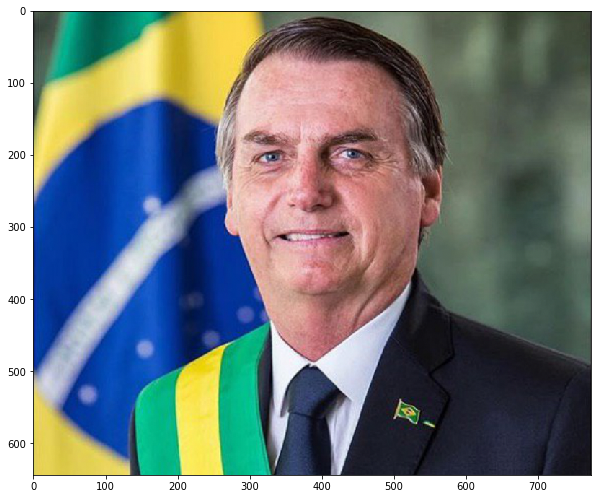

In [11]:
image_01 = cv2.imread('persons/bolsonaro.png')
image_01 = cv2.cvtColor(image_01, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image_01)
plt.show()

## Capturar a região do rosto

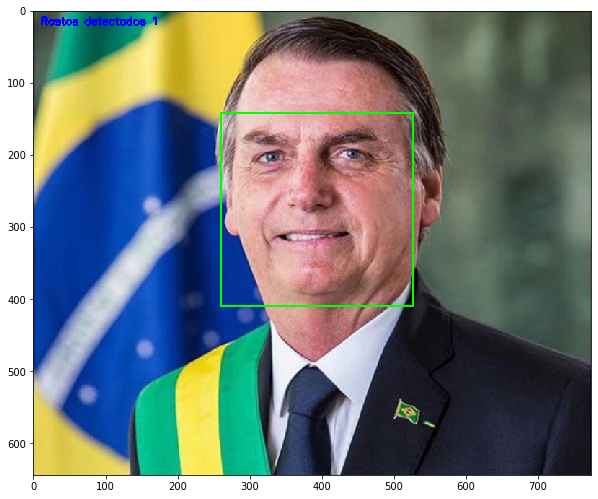

In [12]:
face = face_detection(image_01, detector)

plt.figure(figsize=(10, 10))
plt.imshow(face)
plt.show()

### Será que continua capturando o rosto se a imagem estiver alterada?

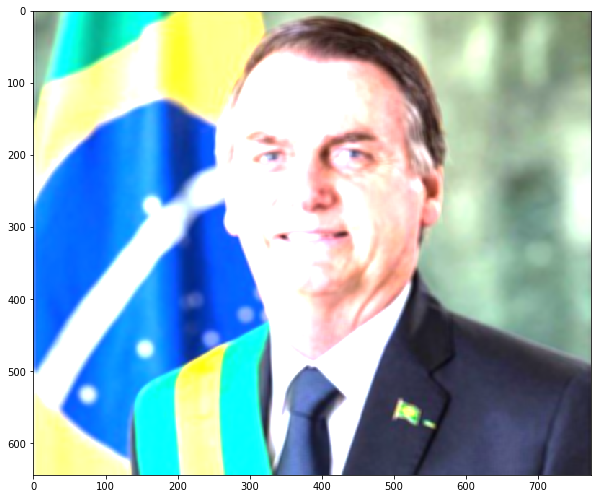

In [13]:
kernel = np.ones((7, 7),np.float32)/25
result_2d_filter = cv2.filter2D(image_01,-1,kernel)

plt.figure(figsize=(10, 10))
plt.imshow(result_2d_filter)
plt.show()

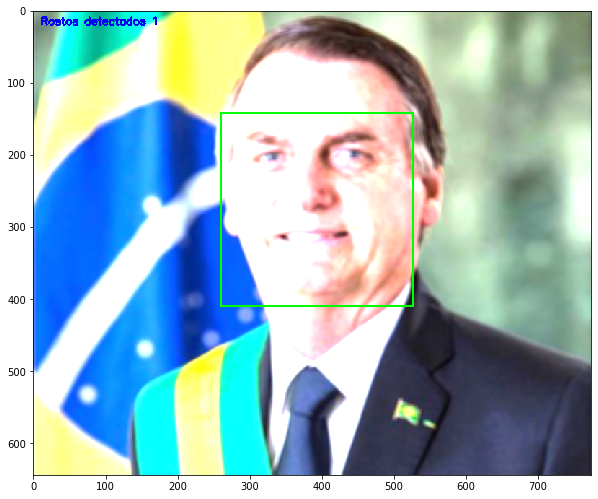

In [14]:
face = face_detection(result_2d_filter, detector)

plt.figure(figsize=(10, 10))
plt.imshow(face)
plt.show()

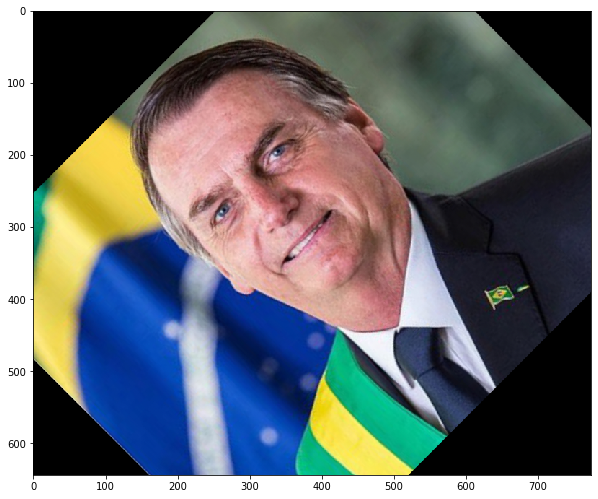

In [15]:
rows, cols, _ = image_01.shape

M = cv2.getRotationMatrix2D((cols/2,rows/2), 45, 1)
rotate_image_01 = cv2.warpAffine(image_01,M,(cols,rows))

plt.figure(figsize=(10, 10))
plt.imshow(rotate_image_01)
plt.show()

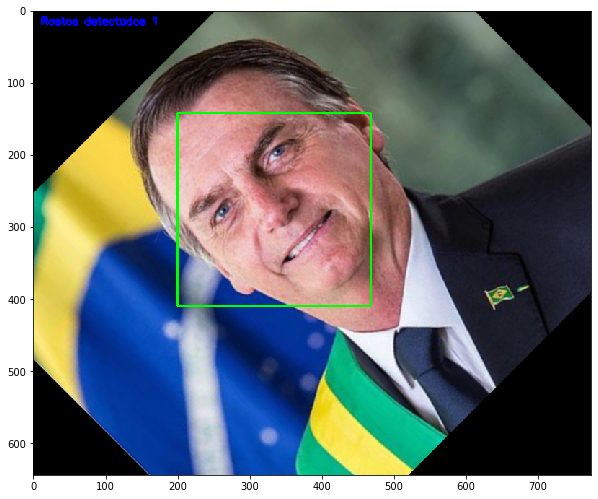

In [16]:
face = face_detection(rotate_image_01, detector)

plt.figure(figsize=(10, 10))
plt.imshow(face)
plt.show()


## E se tiver mais de um rosto?

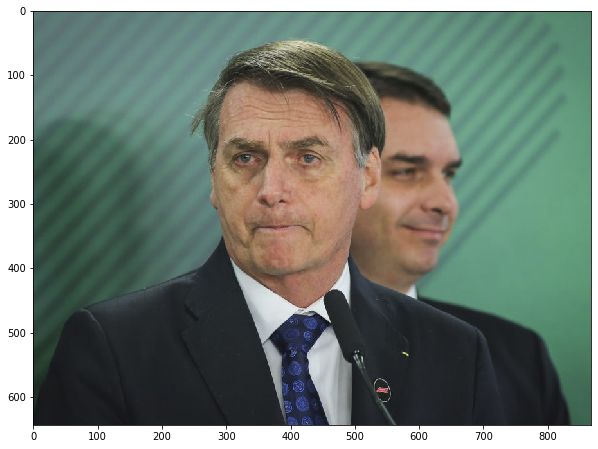

In [17]:
image_02 = cv2.imread('persons/bolsonaro_02.jpg')
image_02 = cv2.cvtColor(image_02, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image_02)
plt.show()

## Será que ele detecta mesmo todos os rostos?


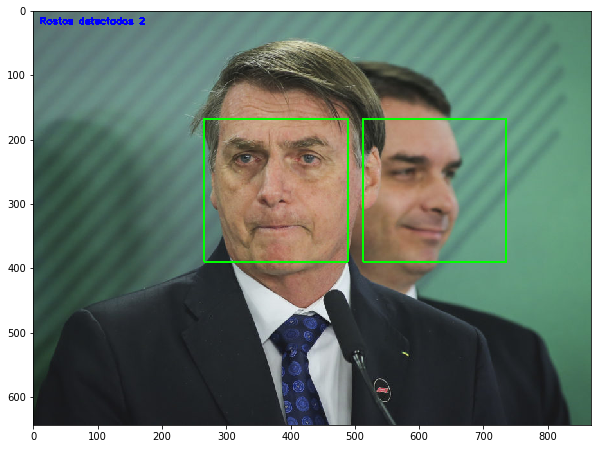

In [18]:
faces = face_detection(image_02, detector)

plt.figure(figsize=(10, 10))
plt.imshow(faces)
plt.show()

# Pontos de interesse do rosto



![alt text](https://www.pyimagesearch.com/wp-content/uploads/2017/04/facial_landmarks_68markup-768x619.jpg)


## Vamos ver esses pontos nas imagens

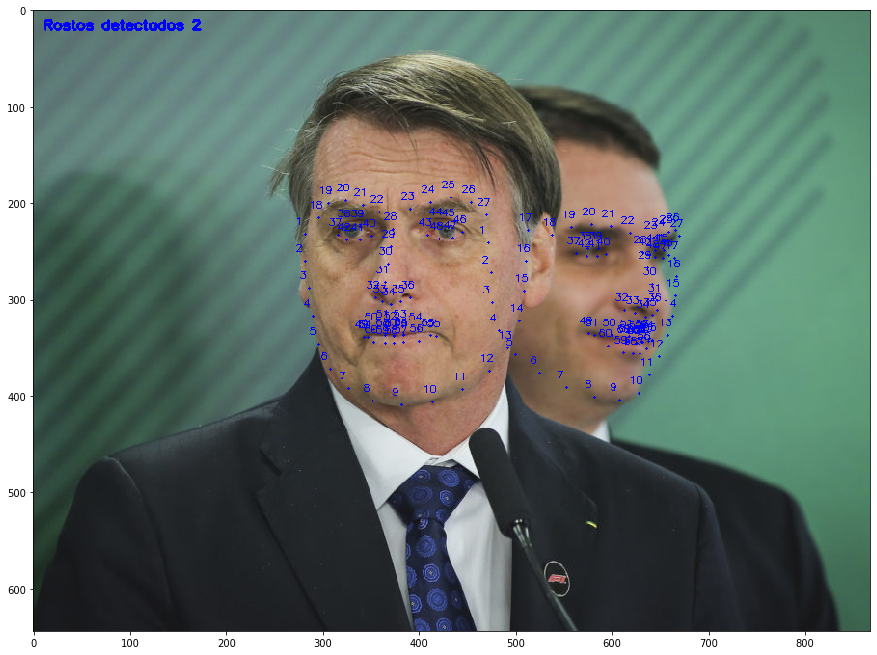

In [19]:
land = landmarks_detection(image_02, detector, predictor)

plt.figure(figsize=(15, 15))
plt.imshow(land)
plt.show()

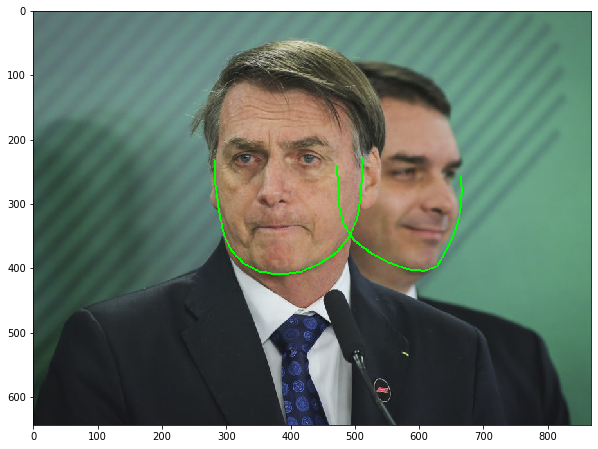

In [20]:
land = landmarks_draw(image_02, detector, predictor)

plt.figure(figsize=(10, 10))
plt.imshow(land)
plt.show()

## Regiões de interesse do rosto

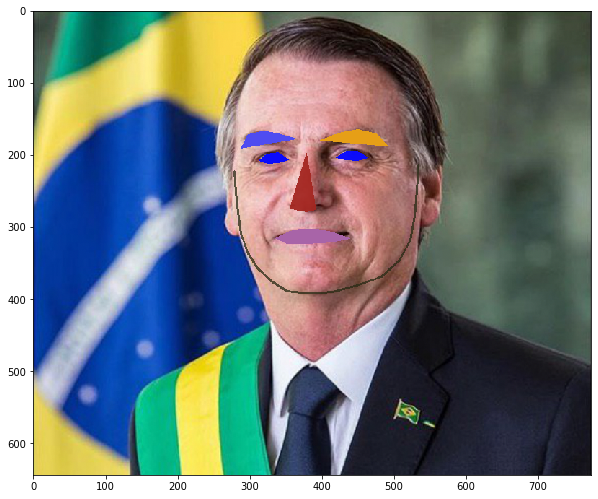

In [21]:
land = facial_landmarks(image_01, predictor, detector)

plt.figure(figsize=(10, 10))
plt.imshow(land)
plt.show()

## Vamos brincar um pouco com essas regiões de interesse... ou tentar.

In [22]:
overlay = image_01.copy()
pts = get_coordinates(image_01, 'mouth', detector, predictor)[0]

for l in range(1, len(pts)):
    ptA = tuple(pts[l - 1])
    ptB = tuple(pts[l])
    cv2.line(overlay, ptA, ptB, (0, 255, 0), 2)

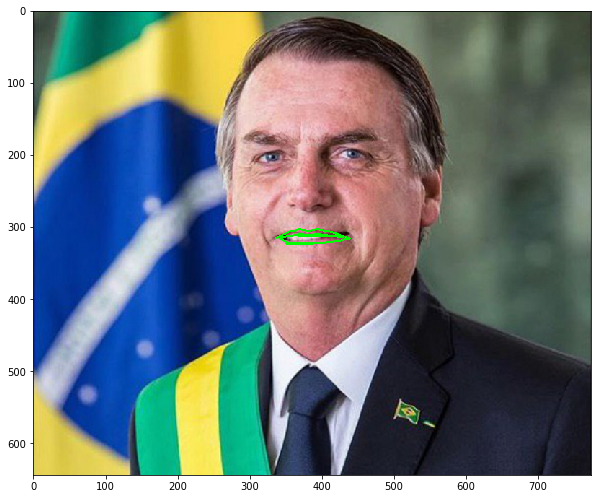

In [23]:
plt.figure(figsize=(10, 10))
plt.imshow(overlay)
plt.show()

## Ops... Vamos tentar de novo...

In [24]:
def get_mouth(image, offset=0):
    overlay = image.copy()
    pts = get_coordinates(image, 'mouth', detector, predictor)[0]
    
    ptA = tuple(pts[0])  # Canto esquerdo da boca
    ptB = tuple(pts[6])  # Canto direito da boca

    ptC = tuple(pts[3])  # Canto superior da boca
    ptD = tuple(pts[9])  # Canto inferior da boca

    h = abs(ptC[1] - ptD[1])
    w = abs(ptA[0] - ptB[0])

    # img[y:y+h, x:x+w]
    region = overlay[ptA[1] - offset: ptA[1] + h,
                     ptA[0] - offset: ptA[0] + w + offset]
    
    return region, ptB, ptD, w
    

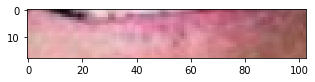

In [26]:
overlay, ptB, ptD, w = get_mouth(image_01)

plt.figure(figsize=(5, 5))
plt.imshow(overlay)
plt.show()

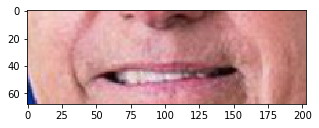

In [27]:
overlay, ptB, ptD, w = get_mouth(image_01, offset=50)

plt.figure(figsize=(5, 5))
plt.imshow(overlay)
plt.show()

### Que tal um pouco de barba?

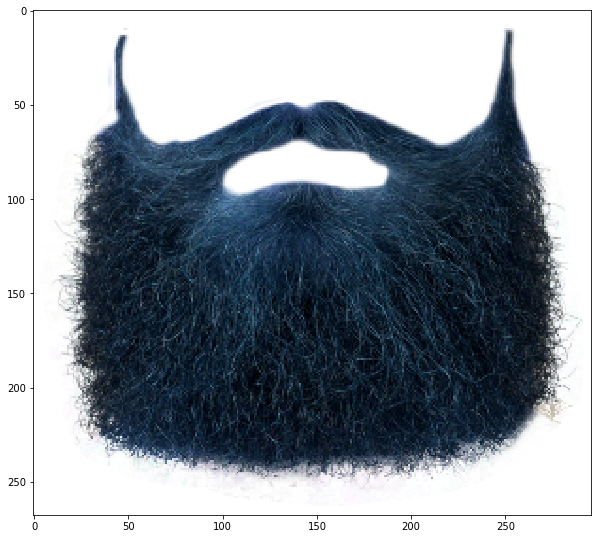

In [29]:
sticker_beard = cv2.imread('stickers/barba_02.png', -1)
watermark_beard = cv2.resize(sticker_beard, None, fx=0.4, fy=0.4)

plt.figure(figsize=(10, 10))
plt.imshow(watermark_beard)
plt.show()

In [30]:
def insert_sticker(image, watermark, pt1, pt2, w, offset_h, offset_w, div, mult):
    frame = cv2.cvtColor(image, cv2.COLOR_RGB2BGRA)
    frame_h, frame_w, frame_c = frame.shape

    # overlay with 4 channels BGR and Alpha
    overlay = frame.copy()
    watermark_h, watermark_w, watermark_c = watermark.shape

    # replace overlay pixels with watermark pixel values
    for i in range(0, watermark_h):
        for j in range(0, watermark_w):
            if watermark[i,j][3] != 0:
                w_offset = pt1 - (w*mult) - offset_w
                h_offset = pt2 - (int(pt2/div) + offset_h)
                overlay[h_offset + i, w_offset + j] = watermark[i, j]

    return cv2.cvtColor(overlay, cv2.COLOR_BGRA2RGB)

In [31]:
overlay_01 = insert_sticker(image_01, watermark_beard, ptB[0],
                            ptD[1], w, 30, 0, 5, 2)

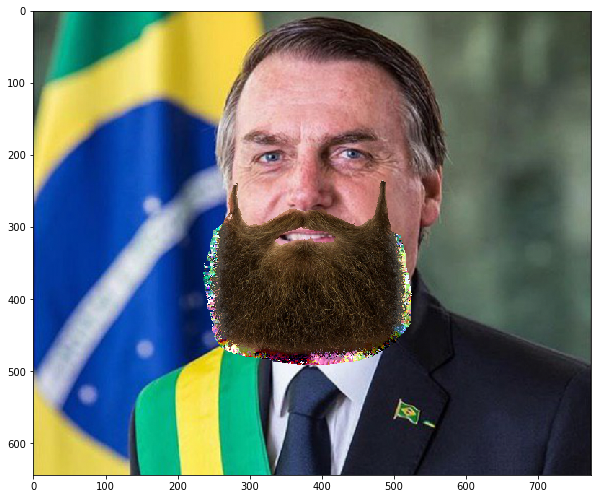

In [32]:
plt.figure(figsize=(10, 10))
plt.imshow(overlay_01)
plt.show()

### Ou um óculos?

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


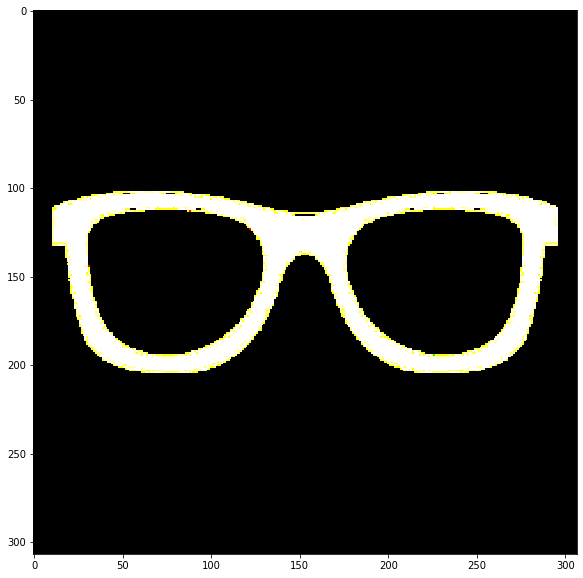

In [33]:
stickers_gl = cv2.imread('stickers/oculos_01.png', -1)
watermark_gl = cv2.resize(stickers_gl, None, fx=0.6, fy=0.6)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(watermark_gl, cv2.COLOR_BGRA2RGB))
plt.show()

### Precisamos saber onde está os olhos...

In [34]:
def get_right_eye(image, offset=0):
    overlay = image.copy()
    pts = get_coordinates(image, 'right_eye', detector, predictor)[0]

    ptA = tuple(pts[0])  # Canto esquerdo do olho
    ptB = tuple(pts[3])  # Canto direito do olho

    ptC = tuple(pts[1])  # Canto superior do olho
    ptD = tuple(pts[5])  # Canto inferior do olho

    h = abs(ptC[1] - ptD[1])
    w = abs(ptA[0] - ptB[0])

    # img[y:y+h, x:x+w]
    region = overlay[ptA[1] - offset: ptA[1] + h,
                     ptA[0] - offset: ptA[0] + w + offset]
    
    return region, ptB, ptD, w
    

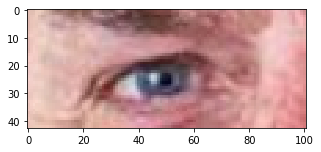

In [35]:
offset = 30
overlay, ptB, ptD, w = get_right_eye(image_01, offset)

plt.figure(figsize=(5, 5))
plt.imshow(overlay)
plt.show()

### E agora vamos ajudar ele a enxergar melhor :)

In [36]:
overlay_02 = insert_sticker(image_01, watermark_gl, ptB[0], ptD[1], w, offset, 0, 2, 3)

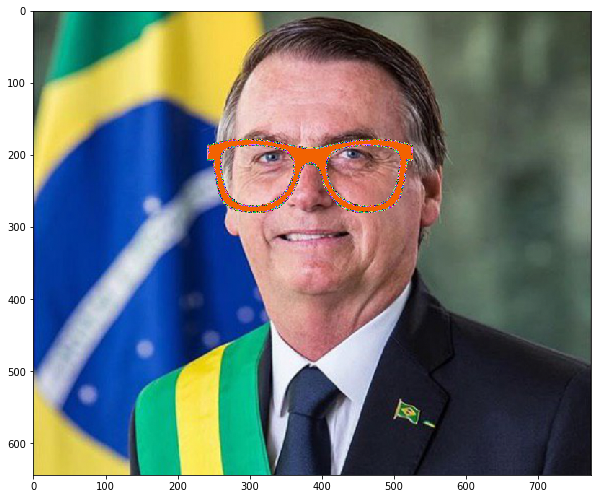

In [37]:
plt.figure(figsize=(10, 10))
plt.imshow(overlay_02)
plt.show()

## O resultado final

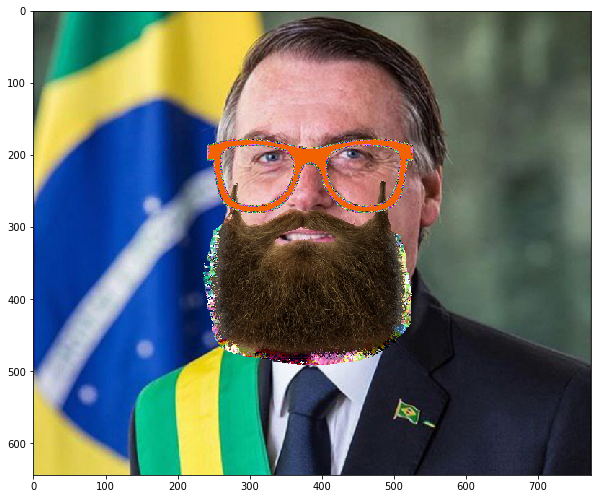

In [38]:
overlay_02 = insert_sticker(overlay_01, watermark_gl, ptB[0],
                            ptD[1], w, offset, 0, 2, 3)

plt.figure(figsize=(10, 10))
plt.imshow(overlay_02)
plt.show()

## Outros resultados \o/

In [39]:
height, width = image_01.shape[:2]

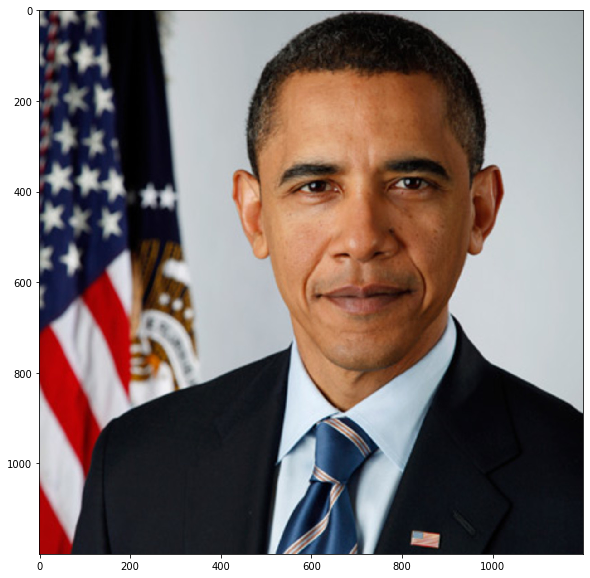

In [40]:
image_03 = cv2.imread('persons/barack_obama.jpg')
image_03 = cv2.cvtColor(image_03, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image_03)
plt.show()

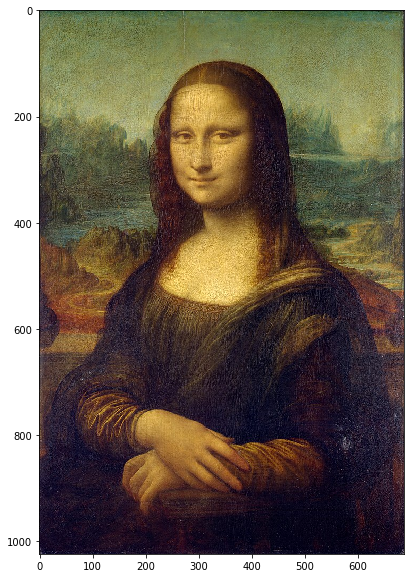

In [41]:
image_04 = cv2.imread('persons/monalisa.jpg')
image_04 = cv2.cvtColor(image_04, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image_04)
plt.show()

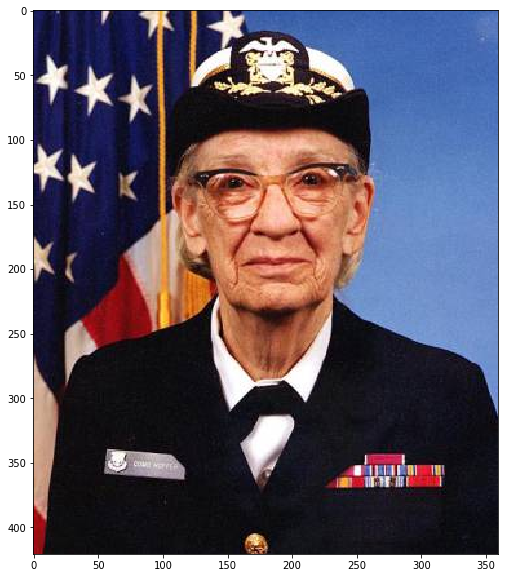

In [42]:
image_05 = cv2.imread('persons/grace_hopper.jpg')
image_05 = cv2.cvtColor(image_05, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image_05)
plt.show()

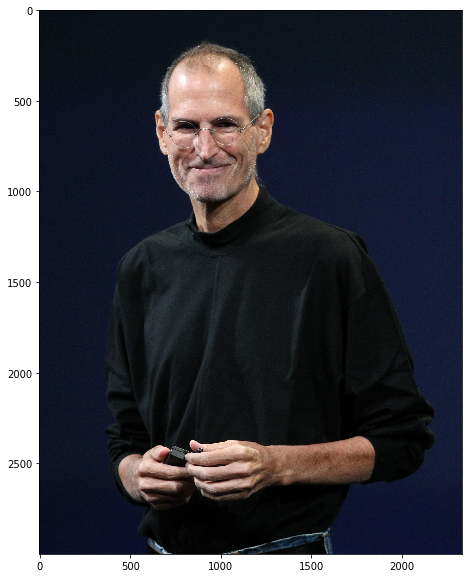

In [43]:
image_06 = cv2.imread('persons/steve_jobs.jpg')
image_06 = cv2.cvtColor(image_06, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image_06)
plt.show()

In [44]:
image_03 = cv2.resize(image_03,(height, width))
image_04 = cv2.resize(image_04,(height, width))
image_05 = cv2.resize(image_05,(height, width))
image_06 = cv2.resize(image_06,(height, width))

## E vamos capturar a região dos olhos de novo...

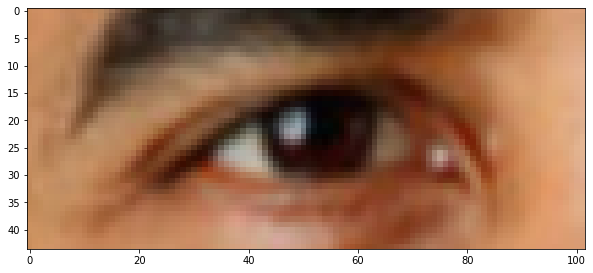

In [45]:
offset = 30
overlay_03, ptB, ptD, w = get_right_eye(image_03, offset)

plt.figure(figsize=(10, 10))
plt.imshow(overlay_03)
plt.show()

### Agora a melhor parte o/

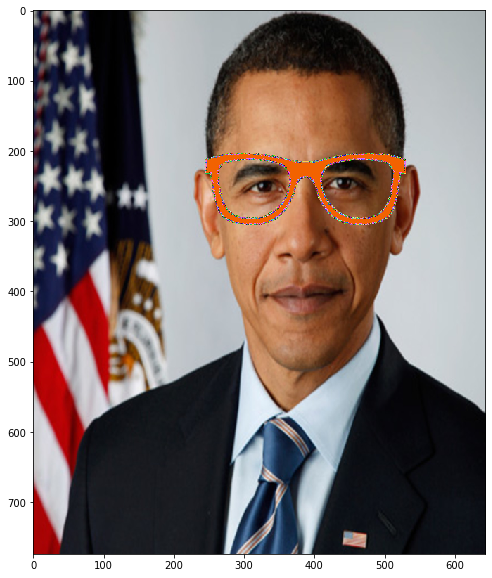

In [46]:
overlay_03 = insert_sticker(image_03, watermark_gl, ptB[0], ptD[1],
                            w, offset, offset, 2, 2)

plt.figure(figsize=(10, 10))
plt.imshow(overlay_03)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


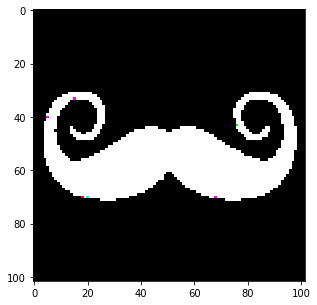

In [47]:
stickers_mus = cv2.imread('stickers/bigode_04.png', -1)
watermark_mus = cv2.resize(stickers_mus, None, fx=0.2, fy=0.2)

plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(watermark_mus, cv2.COLOR_BGRA2RGB))
plt.show()

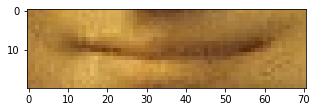

In [48]:
offset = 10
overlay_04, ptB, ptD, w = get_mouth(image_04, offset)

plt.figure(figsize=(5, 5))
plt.imshow(overlay_04)
plt.show()

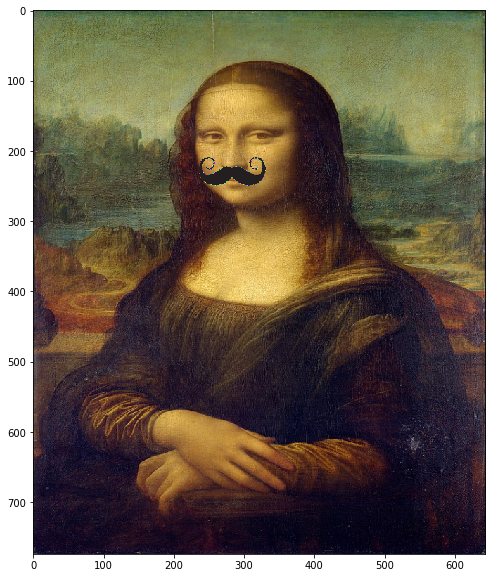

In [49]:
overlay_04 = insert_sticker(image_04, watermark_mus, ptB[0],
                            ptD[1], w, offset, -20, 4, 2)

plt.figure(figsize=(10, 10))
plt.imshow(overlay_04)
plt.show()

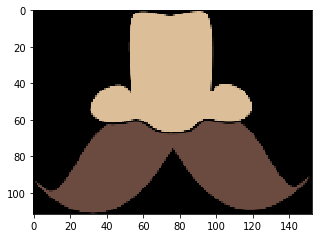

In [50]:
stickers_dbz = cv2.imread('stickers/nariz_02.png', -1)
watermark_dbz = cv2.resize(stickers_dbz, None, fx=0.3, fy=0.3)

plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(watermark_dbz, cv2.COLOR_BGRA2RGB))
plt.show()

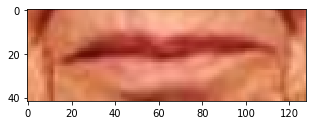

In [51]:
offset = 20
overlay_05, ptB, ptD, w = get_mouth(image_05, offset)

plt.figure(figsize=(5, 5))
plt.imshow(overlay_05)
plt.show()

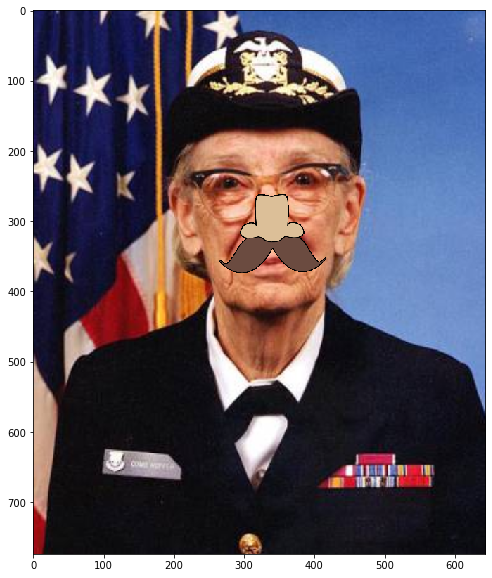

In [52]:
overlay_05 = insert_sticker(image_05, watermark_dbz, ptB[0],
                            ptD[1], w, offset, -offset*3, 4, 2)

plt.figure(figsize=(10, 10))
plt.imshow(overlay_05)
plt.show()

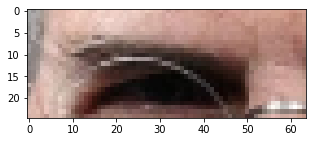

In [53]:
offset = 20
overlay_06, ptB, ptD, w = get_right_eye(image_06, offset)

plt.figure(figsize=(5, 5))
plt.imshow(overlay_06)
plt.show()

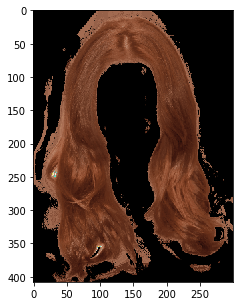

In [54]:
stickers_hair = cv2.imread('stickers/cabelo_04.png', -1)
watermark_hair = cv2.resize(stickers_hair, None, fx=0.3, fy=0.3)

plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(watermark_hair, cv2.COLOR_BGRA2RGB))
plt.show()

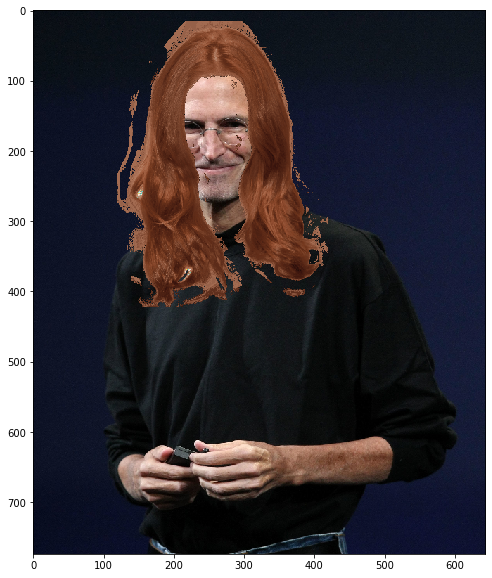

In [55]:
offset = 70

overlay_06 = insert_sticker(image_06, watermark_hair, ptB[0],
                            ptD[1], w, offset, offset, 2, 2)

plt.figure(figsize=(10, 10))
plt.imshow(overlay_06)
plt.show()